In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

from tensorflow.keras.preprocessing import image

from glob import glob

In [2]:
folders = glob('C:/Users/HP/Downloads/LungColon' + '/*')

print('New Paths: ', folders)

IMAGE_FILES = glob('C:/Users/HP/Downloads/LungColon' + '/*/*.jpeg')
print('Images Count: ', len(IMAGE_FILES))

New Paths:  ['C:/Users/HP/Downloads/LungColon\\colon_aca', 'C:/Users/HP/Downloads/LungColon\\colon_n', 'C:/Users/HP/Downloads/LungColon\\lung_aca', 'C:/Users/HP/Downloads/LungColon\\lung_n', 'C:/Users/HP/Downloads/LungColon\\lung_scc']
Images Count:  25000


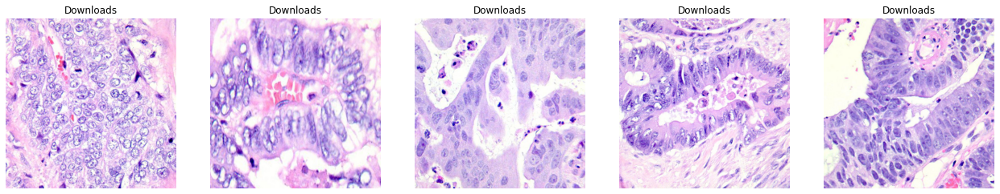

In [3]:
SAMPLES = IMAGE_FILES[:5]

plt.figure(figsize=(22, 8)) 
global c
c = 0

for i in SAMPLES:
    plt.subplot(1, 5, c + 1)
    c += 1
    t = i.split('/')
    plt.title(t[3])
    plt.imshow(image.load_img(i))
    plt.axis('off')
plt.show()

In [4]:
train_imgs = IMAGE_FILES[:15]
num_show = 15
columns = 5

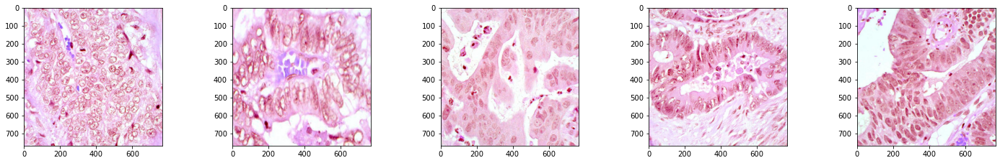

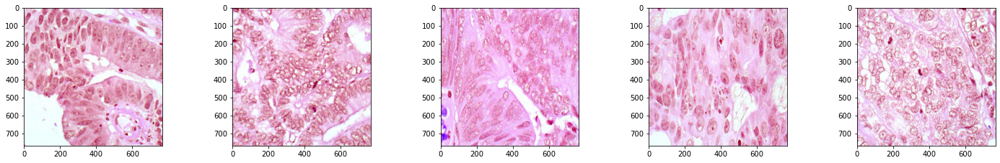

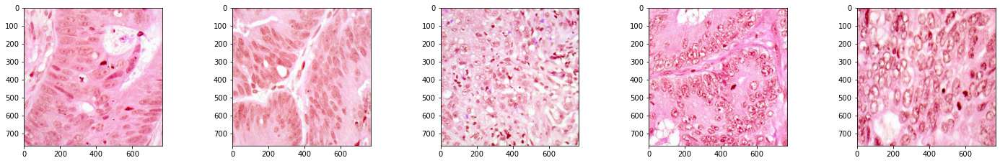

<Figure size 1800x864 with 0 Axes>

In [5]:
plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break
    
    temp_img = cv2.imread(train_img, cv2.IMREAD_COLOR)
    
    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(temp_img)
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

# CLAHE(Contrast Limited Adaptive Histogram Equalization)

In [6]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16, 16))

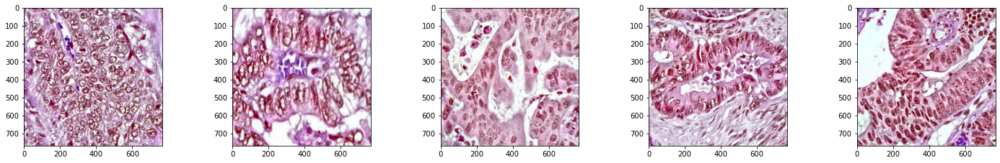

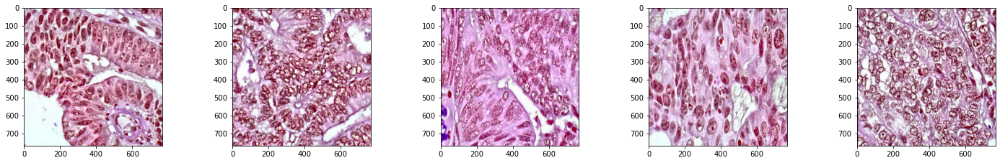

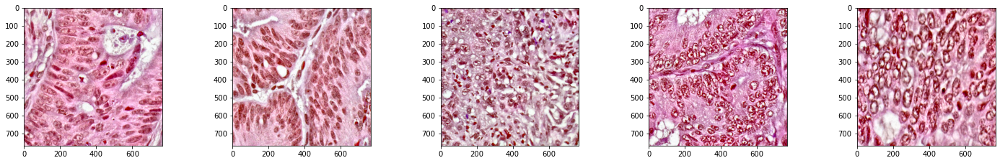

<Figure size 1800x864 with 0 Axes>

In [7]:
plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break
    
    temp_img = cv2.imread(train_img, cv2.IMREAD_COLOR)        
    img_lab = cv2.cvtColor(temp_img, cv2.COLOR_BGR2Lab)

    l, a, b = cv2.split(img_lab)
    img_l = clahe.apply(l)
    img_clahe = cv2.merge((img_l, a, b))

    img_clahe = cv2.cvtColor(img_clahe, cv2.COLOR_Lab2BGR)
    
    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(img_clahe)
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

# Otsu threshold

In [8]:
from skimage.filters import threshold_otsu

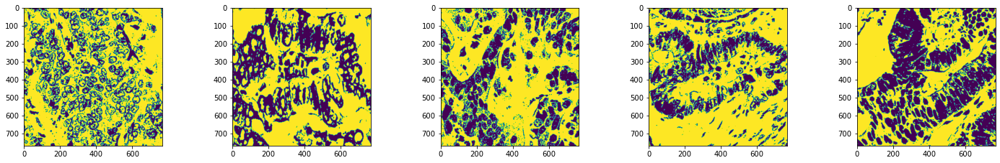

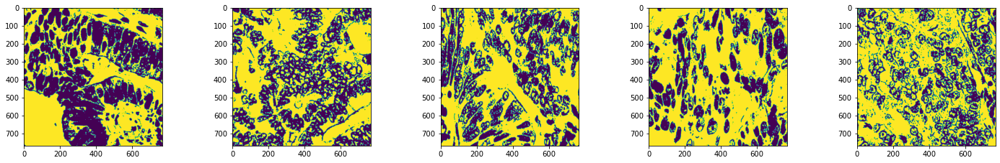

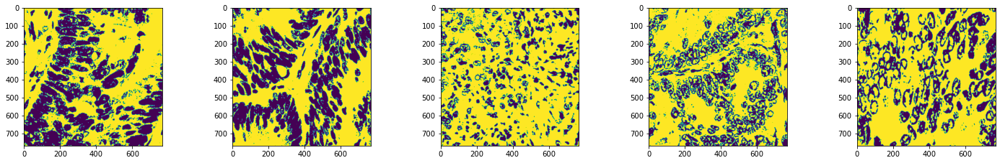

<Figure size 1800x864 with 0 Axes>

In [21]:
plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break

    bgrimg = cv2.imread(train_img)
    grayimg = cv2.cvtColor(bgrimg, cv2.COLOR_BGR2GRAY)
    thresh_val = threshold_otsu(grayimg)
#     print('The optimal seperation value is',thresh_val)
    maskimg=np.where(grayimg>thresh_val,1,0)

    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(maskimg)
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

# Kmeans

In [10]:
from sklearn.cluster import KMeans

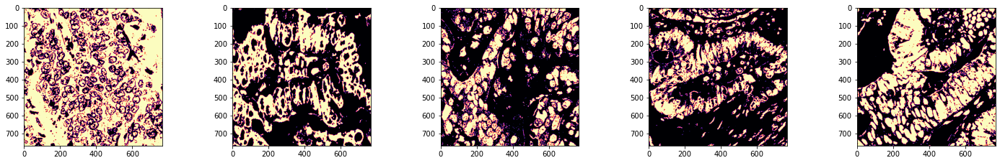

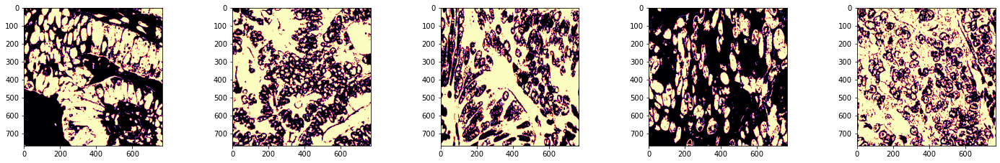

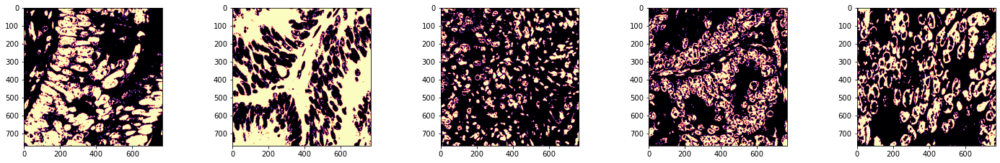

<Figure size 1800x864 with 0 Axes>

In [11]:
kmeans=KMeans(n_clusters=2) #2 as we're still trying to seperate the lighter coloured nuclei from the darker coloured background 

plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break

    bgrimg = cv2.imread(train_img)
    grayimg = cv2.cvtColor(bgrimg, cv2.COLOR_BGR2GRAY)
    kmeans.fit(grayimg.reshape(grayimg.shape[0]*grayimg.shape[1],1))

    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(kmeans.labels_.reshape(768, 768),cmap='magma')
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

# Edge Detection

### Sobel Filter

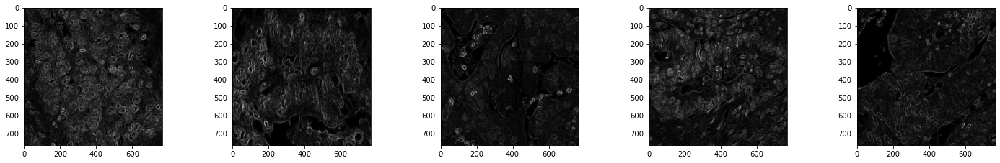

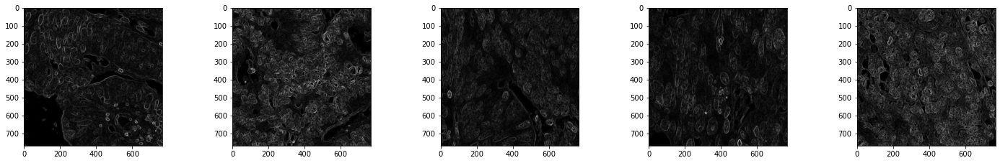

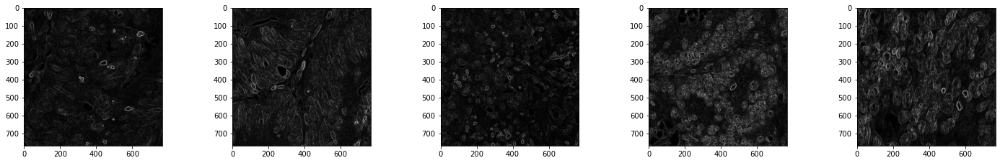

<Figure size 1800x864 with 0 Axes>

In [12]:
plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break

    bgrimg = cv2.imread(train_img)
    grayimg = cv2.cvtColor(bgrimg, cv2.COLOR_BGR2GRAY)
    
    #cv2.Sobel arguments - the image, output depth, order of derivative of x, order of derivative of y, kernel/filter matrix size
    sobelx = cv2.Sobel(grayimg,int(cv2.CV_64F),1,0,ksize=3) #ksize=3 means we'll be using the 3x3 Sobel filter
    sobely = cv2.Sobel(grayimg,int(cv2.CV_64F),0,1,ksize=3)
    
    #Now to combine the 2 sobel filters
    sobel = np.sqrt(np.square(sobelx) + np.square(sobely))

    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(sobel,cmap='gray')
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

### Cany Edge Detaction

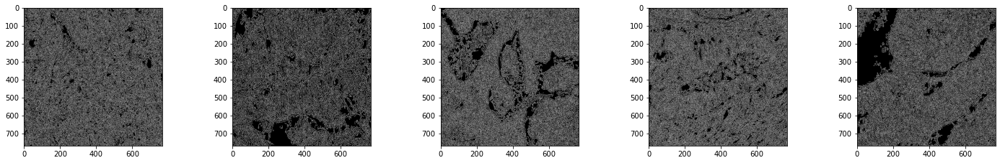

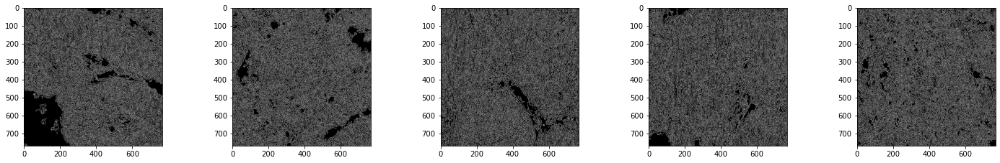

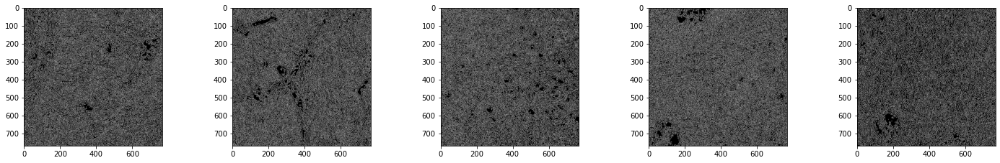

<Figure size 1800x864 with 0 Axes>

In [13]:
plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break

    bgrimg = cv2.imread(train_img)
    grayimg = cv2.cvtColor(bgrimg, cv2.COLOR_BGR2GRAY)
    
    canny = cv2.Canny(grayimg,0,21)

    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(canny,cmap='gray')
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

# Increased contrast

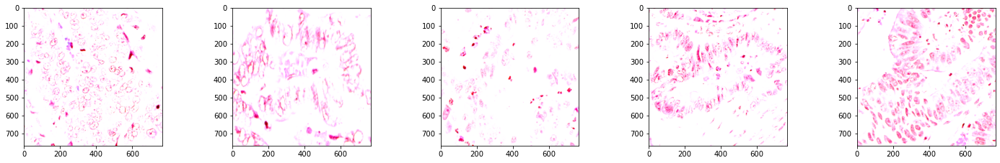

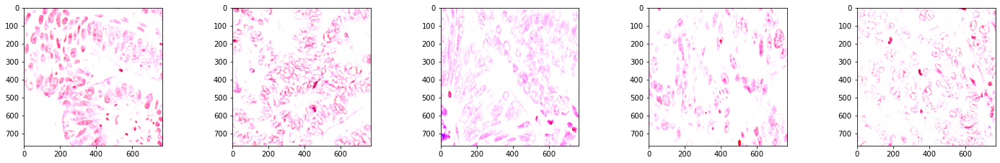

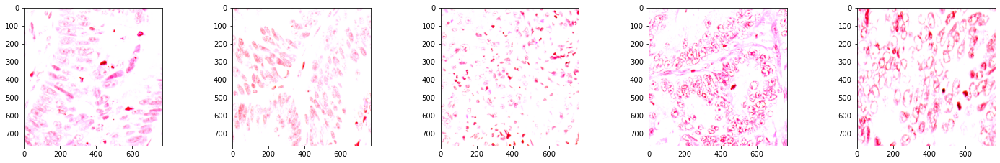

<Figure size 1800x864 with 0 Axes>

In [14]:
plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break

    bgrimg = cv2.imread(train_img)
    contrast_img = cv2.addWeighted(bgrimg, 1.5, np.zeros(bgrimg.shape, bgrimg.dtype), 0, 0)

    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(contrast_img)
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

# Detached Edge

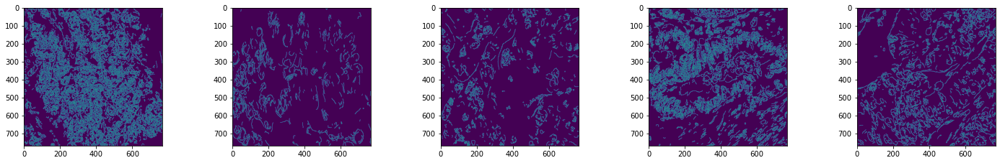

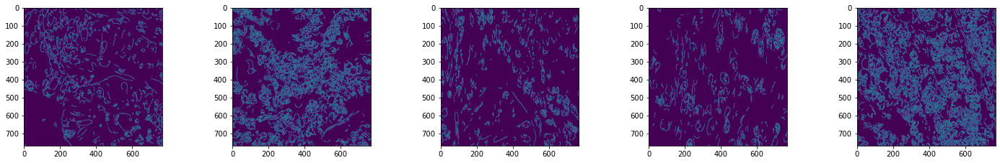

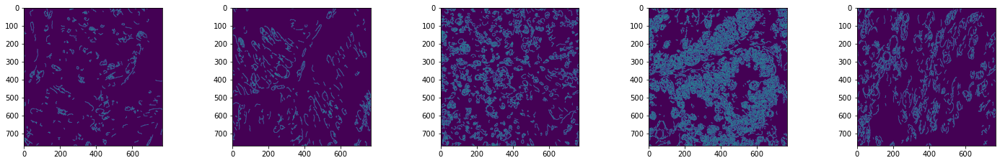

<Figure size 1800x864 with 0 Axes>

In [15]:
min_intensity_grad, max_intensity_grad = 100, 200

plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break

    bgrimg = cv2.imread(train_img)
    edge_img = cv2.Canny(bgrimg, min_intensity_grad, max_intensity_grad)

    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(edge_img)
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

# Denoising

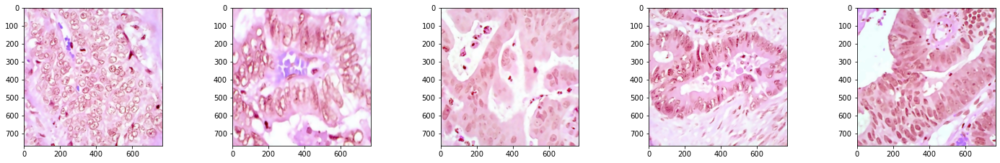

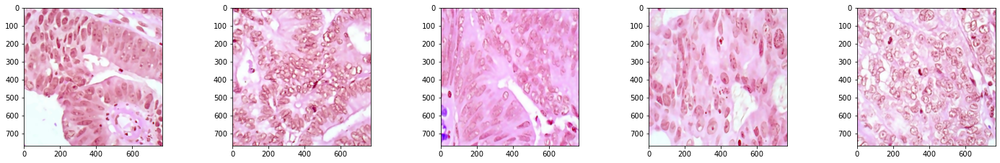

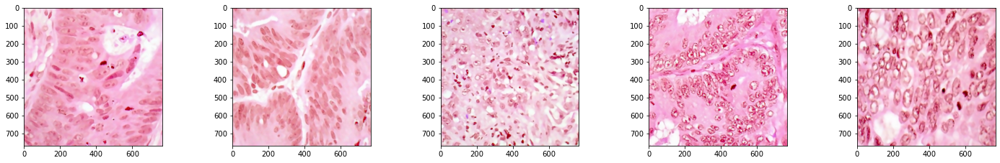

<Figure size 1800x864 with 0 Axes>

In [18]:
plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break

    bgrimg = cv2.imread(train_img)
    dst_img = cv2.fastNlMeansDenoisingColored(bgrimg, None, 10, 10, 7, 15)
    
    plt.subplot(int(10 / columns + 1), columns, idx + 1)
    plt.imshow(dst_img)
    if idx % 5 == 4:
        plt.show()
        plt.figure(figsize=(25,12))

<Figure size 1800x864 with 0 Axes>

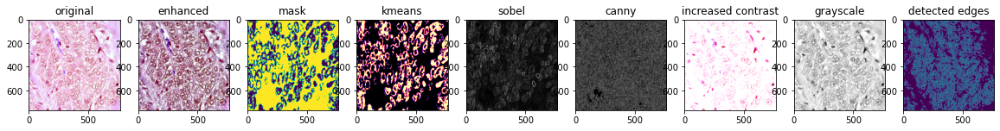

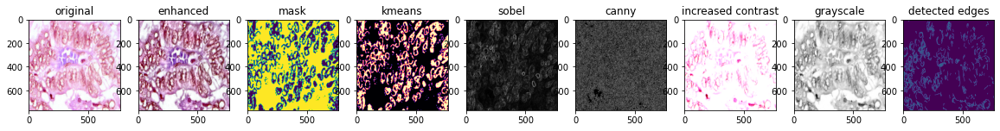

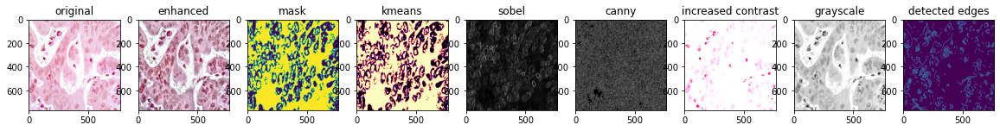

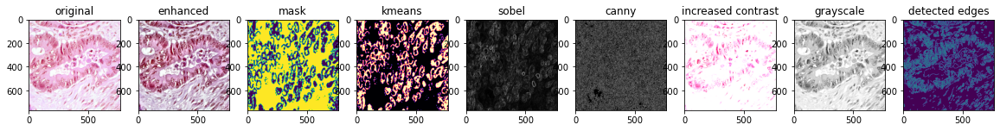

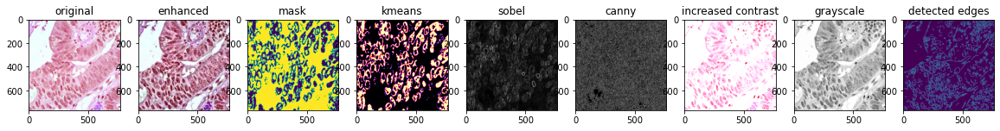

...

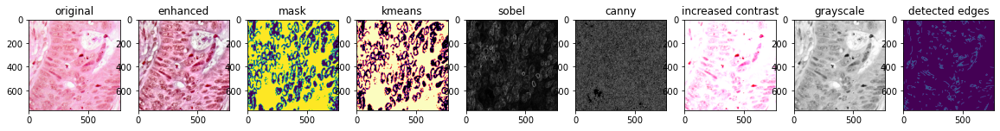

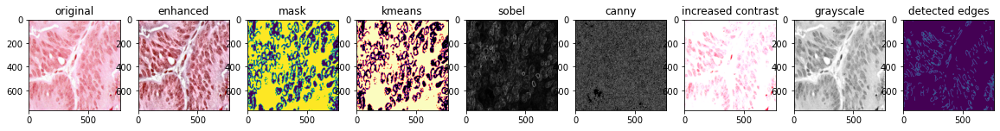

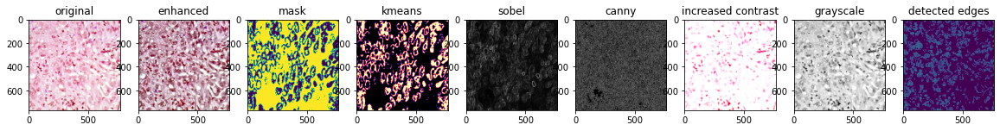

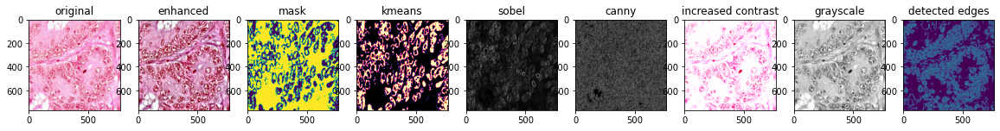

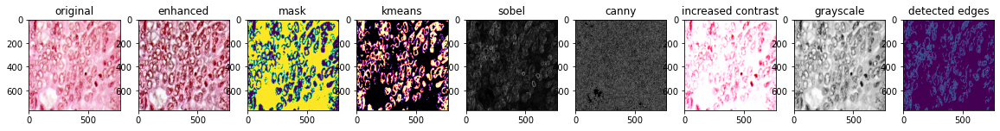

In [16]:
min_intensity_grad, max_intensity_grad = 100, 200
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16, 16))
kmeans=KMeans(n_clusters=2) #2 as we're still trying to seperate the lighter coloured nuclei from the darker coloured background 

plt.figure(figsize=(25,12))
for idx, train_img in enumerate(train_imgs):
    if idx >= num_show:
        break

    # Original:
    bgrimg = cv2.imread(train_img)

    #Enhanced:
    img_lab = cv2.cvtColor(bgrimg, cv2.COLOR_BGR2Lab)
    l, a, b = cv2.split(img_lab)
    img_l = clahe.apply(l)
    img_clahe = cv2.merge((img_l, a, b))
    img_clahe = cv2.cvtColor(img_clahe, cv2.COLOR_Lab2BGR)

    # Otsu Thresold:
    thresh_val = threshold_otsu(grayimg)
    maskimg=np.where(grayimg>thresh_val,1,0)
    
    # KMeans:
    kmeans.fit(grayimg.reshape(grayimg.shape[0]*grayimg.shape[1],1))

    # Sober Edge Detaction:
    sobelx = cv2.Sobel(grayimg,int(cv2.CV_64F),1,0,ksize=3) #ksize=3 means we'll be using the 3x3 Sobel filter
    sobely = cv2.Sobel(grayimg,int(cv2.CV_64F),0,1,ksize=3)
    sobel = np.sqrt(np.square(sobelx) + np.square(sobely))

    # Canny Edge Detection:
    canny = cv2.Canny(grayimg, 0, 21)

    # Contrast:
    contrast_img = cv2.addWeighted(bgrimg, 1.5, np.zeros(bgrimg.shape, bgrimg.dtype), 0, 0)

    # Grayscle:
    img_gray = cv2.cvtColor(bgrimg, cv2.COLOR_BGR2GRAY)

    # Detached Edge:
    edge_img = cv2.Canny(bgrimg, min_intensity_grad, max_intensity_grad)
    
    # Denoising:
    dst_img = cv2.fastNlMeansDenoisingColored(bgrimg, None, 10, 10, 7, 15)

    fig, ax = plt.subplots(1, 10, figsize=(20, 25))
    ax[0].imshow(bgrimg); ax[0].set_title('original')
    ax[1].imshow(img_clahe); ax[1].set_title('enhanced')
    ax[2].imshow(maskimg); ax[2].set_title('Otsu Thresold')
    ax[3].imshow(kmeans.labels_.reshape(768, 768),cmap='magma'); ax[3].set_title('kmeans')
    ax[4].imshow(sobel, cmap='gray'); ax[4].set_title('sobel')
    ax[5].imshow(canny, cmap='gray'); ax[5].set_title('canny')
    ax[6].imshow(contrast_img); ax[6].set_title('increased contrast')
    ax[7].imshow(img_gray, cmap='gray', vmin = 0, vmax = 255); ax[7].set_title('grayscale')
    ax[8].imshow(edge_img); ax[8].set_title('detected edges')
    ax[9].imshow(dst_img); ax[9].set_title('denoising')
    plt.show()